# Анализ рынка заведений общественного питания Москвы

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

## Загрузка библиотек

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster
import json
import geopandas as gpd
from collections import Counter

## Загрузка датасетов

In [5]:
places = 'datasets/moscow_places.csv'
df = pd.read_csv(places, sep = ',')

In [6]:
print("Общая информация о данных:")
print(df.info())

print("\nПервые 5 строк данных:")
display(df.head())

print("\nОсновные статистики числовых столбцов:")
display(df.describe())

Общая информация о данных:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB
None

Первые 5 строк данных:


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0



Основные статистики числовых столбцов:


,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


## Предобработка данных

In [8]:
# Проверка дубликатов
print(f"\nПроверка дубликатов:")
print(f"  Полных дубликатов строк: {df.duplicated().sum()}")
print(f"  Дубликатов по названию и адресу: {df.duplicated(subset=['name', 'address']).sum()}")

# Проверка пропусков
print("\nПропущенные значения:")
missing_data = df.isnull().sum()
missing_percent = (df.isnull().mean().round(2) * 100)
missing_df = pd.DataFrame({
    'Количество пропусков': missing_data,
    'Процент пропусков': missing_percent
})
display(missing_df[missing_df['Количество пропусков'] > 0])

# Создаем столбец street с названиями улиц
print("\nСоздание столбца 'street' с названиями улиц...")

def extract_street(address):
    if pd.isna(address):
        return None

    # Разделяем адрес по запятым
    parts = str(address).split(',')

    # Ищем часть с улицей
    for part in parts:
        part = part.strip()
        # Проверяем, содержит ли часть упоминание улицы
        if ('ул.' in part.lower() or
            'улица' in part.lower() or
            'проспект' in part.lower() or
            'пр.' in part.lower() or
            'шоссе' in part.lower() or
            'набережная' in part.lower()):
            # Убираем 'ул.', 'улица' и т.д.
            street = part.replace('ул.', '').replace('улица', '').replace('Ул.', '').strip()
            return street

    # Если не нашли улицу, возвращаем вторую часть
    if len(parts) > 1:
        return parts[1].strip()

    return None

df['street'] = df['address'].apply(extract_street)
print(f"  Столбец 'street' создан")
print(f"  Уникальных улиц: {df['street'].nunique()}")

# Создаем столбец is_24_7
print("\nСоздание столбца 'is_24_7'...")

def check_24_7(hours):
    if pd.isna(hours):
        return False

    hours_str = str(hours).lower()

    # Проверяем различные варианты обозначения круглосуточной работы
    if ('круглосуточно' in hours_str or
        '24/7' in hours_str or
        '24 часа' in hours_str or
        'ежедневно, 00:00–24:00' in hours_str or
        'ежедневно, круглосуточно' in hours_str):
        return True

    # Проверяем форматы
    if 'ежедневно' in hours_str and '00:00' in hours_str and '24:00' in hours_str:
        return True

    return False

df['is_24_7'] = df['hours'].apply(check_24_7)
print(f"  Столбец 'is_24_7' создан")
print(f"  Круглосуточных заведений: {df['is_24_7'].sum()} ({df['is_24_7'].mean()*100:.1f}%)")

print("\nДанные после предобработки:")
print(f"  Всего записей: {len(df)}")
print(f"  Всего столбцов: {len(df.columns)}")
print(f"  Столбцы: {list(df.columns)}")


Проверка дубликатов:
  Полных дубликатов строк: 0
  Дубликатов по названию и адресу: 0

Пропущенные значения:


,Количество пропусков,Процент пропусков
hours,536,6.0
price,5091,61.0
avg_bill,4590,55.0
middle_avg_bill,5257,63.0
middle_coffee_cup,7871,94.0
seats,3611,43.0



Создание столбца 'street' с названиями улиц...
  Столбец 'street' создан
  Уникальных улиц: 1453

Создание столбца 'is_24_7'...
  Столбец 'is_24_7' создан
  Круглосуточных заведений: 772 (9.2%)

Данные после предобработки:
  Всего записей: 8406
  Всего столбцов: 16
  Столбцы: ['name', 'category', 'address', 'district', 'hours', 'lat', 'lng', 'rating', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup', 'chain', 'seats', 'street', 'is_24_7']


## Анализ данных

### Категории заведений

   Всего категорий: 8
   Топ категорий:
    1. кафе                 - 2378 (28.3%)
    2. ресторан             - 2043 (24.3%)
    3. кофейня              - 1413 (16.8%)
    4. бар,паб              -  765 (9.1%)
    5. пиццерия             -  633 (7.5%)
    6. быстрое питание      -  603 (7.2%)
    7. столовая             -  315 (3.7%)
    8. булочная             -  256 (3.0%)


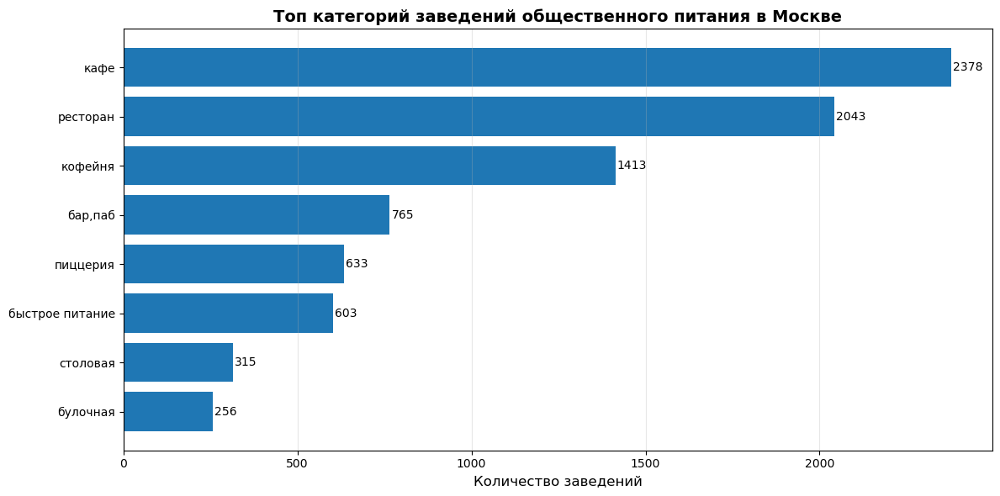


Вывод: Кафе и рестораны составляют более 50% всех заведений, что говорит о преобладании классических форматов общепита.


In [11]:
category_counts = df['category'].value_counts()
print(f"   Всего категорий: {len(category_counts)}")
print(f"   Топ категорий:")
for i, (cat, count) in enumerate(category_counts.head(10).items(), 1):
    print(f"   {i:2d}. {cat:20s} - {count:4d} ({count/len(df)*100:.1f}%)")

# Визуализация распределения категорий (топ-15)
plt.figure(figsize=(12, 6))
top_categories = category_counts.head(15)
bars = plt.barh(top_categories.index[::-1], top_categories.values[::-1])
plt.xlabel('Количество заведений', fontsize=12)
plt.title('Топ категорий заведений общественного питания в Москве', fontsize=14, fontweight='bold')
plt.grid(axis='x', alpha=0.3)

# Добавляем значения на столбцы
for bar in bars:
    width = bar.get_width()
    plt.text(width + 5, bar.get_y() + bar.get_height()/2,
             f'{int(width)}', ha='left', va='center', fontsize=10)

plt.tight_layout()
plt.show()

print("\nВывод: Кафе и рестораны составляют более 50% всех заведений, что говорит о преобладании классических форматов общепита.")

### Количество посадочных мест по категориям

   Категории с наибольшим медианным количеством мест:


,count,mean,median,min,max
category,,,,,
ресторан,1270,121.9,86.0,0.0,1288.0
"бар,паб",468,124.5,82.5,0.0,1288.0
кофейня,751,111.2,80.0,0.0,1288.0
столовая,164,99.8,75.5,0.0,1200.0
быстрое питание,349,98.9,65.0,0.0,1040.0
кафе,1218,97.5,60.0,0.0,1288.0
пиццерия,427,94.5,55.0,0.0,1288.0
булочная,148,89.4,50.0,0.0,625.0


/var/folders/3f/3ng7ys6906ngdc0rwxx8rxq00000gn/T/ipykernel_99082/3950250726.py:13: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  box = plt.boxplot([df_top_cats[df_top_cats['category'] == cat]['seats'].dropna()


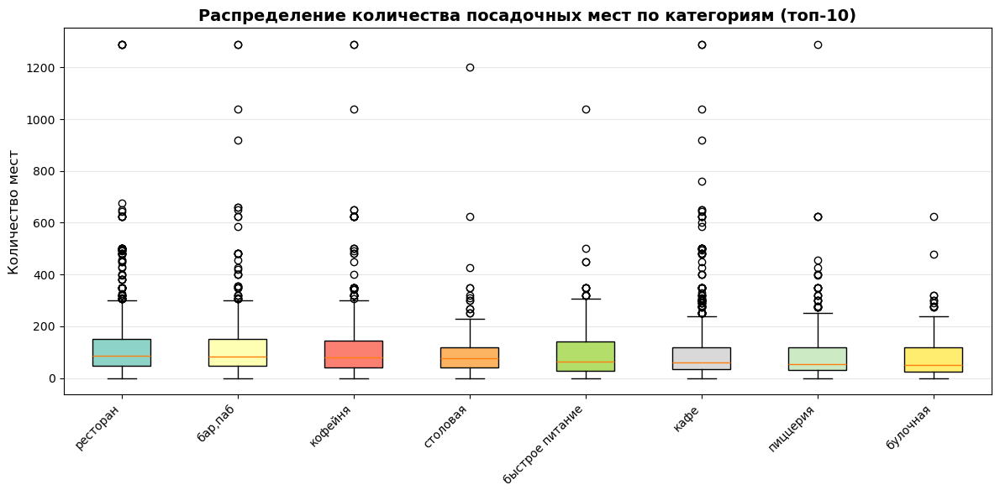


💡 Вывод: Рестораны и бары/пабы имеют наибольшее количество мест, что логично для их формата. На меньшее количество посетителей расчитаны булочные и пиццерии.


In [13]:
# Группируем по категориям и считаем статистику по местам
seats_by_category = df.groupby('category')['seats'].agg(['count', 'mean', 'median', 'min', 'max']).round(1)
seats_by_category = seats_by_category.sort_values('median', ascending=False)

print("   Категории с наибольшим медианным количеством мест:")
display(seats_by_category.head(10))

# Топ-10 категорий по медианному количеству мест
top_cats_for_box = seats_by_category.head(10).index.tolist()
df_top_cats = df[df['category'].isin(top_cats_for_box)]

plt.figure(figsize=(12, 6))
box = plt.boxplot([df_top_cats[df_top_cats['category'] == cat]['seats'].dropna()
                   for cat in top_cats_for_box],
                  labels=top_cats_for_box,
                  patch_artist=True)

colors = plt.cm.Set3(np.linspace(0, 1, len(top_cats_for_box)))
for patch, color in zip(box['boxes'], colors):
    patch.set_facecolor(color)

plt.xticks(rotation=45, ha='right')
plt.ylabel('Количество мест', fontsize=12)
plt.title('Распределение количества посадочных мест по категориям (топ-10)', fontsize=14, fontweight='bold')
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

print("\n💡 Вывод: Рестораны и бары/пабы имеют наибольшее количество мест, что логично для их формата. На меньшее количество посетителей расчитаны булочные и пиццерии.")

### Соотношение сетевых и несетевых заведений

   Несетевые заведения (0): 5201 (61.9%)
   Сетевые заведения (1): 3205 (38.1%)


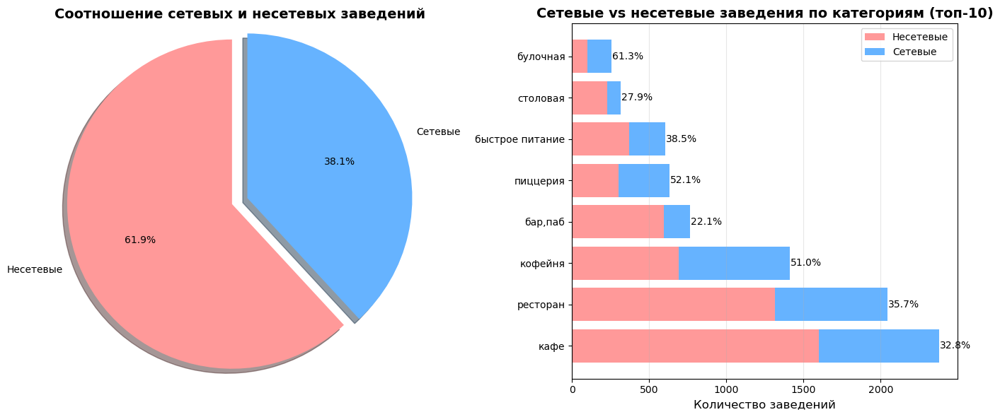


Вывод: Большинство заведений являются несетевыми. Наиболее 'сетевизированными' категориями являются булочные, пиццерии и кофейни.


In [15]:
chain_counts = df['chain'].value_counts()
chain_percent = chain_counts / len(df) * 100

print(f"   Несетевые заведения (0): {chain_counts.get(0, 0)} ({chain_percent.get(0, 0):.1f}%)")
print(f"   Сетевые заведения (1): {chain_counts.get(1, 0)} ({chain_percent.get(1, 0):.1f}%)")

# Круговая диаграмма
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

labels = ['Несетевые', 'Сетевые']
sizes = [chain_counts.get(0, 0), chain_counts.get(1, 0)]
colors = ['#ff9999', '#66b3ff']
explode = (0.1, 0)

ax1.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis('equal')
ax1.set_title('Соотношение сетевых и несетевых заведений', fontsize=14, fontweight='bold')

# Столбчатая диаграмма с разбивкой по категориям
chain_by_category = df.groupby(['category', 'chain']).size().unstack(fill_value=0)
chain_by_category['total'] = chain_by_category.sum(axis=1)
chain_by_category = chain_by_category.sort_values('total', ascending=False).head(10)

# Процент сетевых в каждой категории
chain_by_category['chain_percent'] = (chain_by_category.get(1, 0) / chain_by_category['total'] * 100).round(1)

ax2.barh(chain_by_category.index, chain_by_category.get(0, 0), label='Несетевые', color='#ff9999')
ax2.barh(chain_by_category.index, chain_by_category.get(1, 0), left=chain_by_category.get(0, 0),
         label='Сетевые', color='#66b3ff')

# Добавляем проценты
for i, (idx, row) in enumerate(chain_by_category.iterrows()):
    ax2.text(row['total'] + 5, i, f"{row['chain_percent']}%", va='center', fontsize=10)

ax2.set_xlabel('Количество заведений', fontsize=12)
ax2.set_title('Сетевые vs несетевые заведения по категориям (топ-10)', fontsize=14, fontweight='bold')
ax2.legend()
ax2.grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.show()

print("\nВывод: Большинство заведений являются несетевыми. Наиболее 'сетевизированными' категориями являются булочные, пиццерии и кофейни.")

### Топ-15 популярных сетей

Топ-15 сетей по количеству заведений:
    1. Шоколадница                    - 120 заведений (кофейня)
    2. Домино'с Пицца                 -  76 заведений (пиццерия)
    3. Додо Пицца                     -  74 заведений (пиццерия)
    4. One Price Coffee               -  71 заведений (кофейня)
    5. Яндекс Лавка                   -  69 заведений (ресторан)
    6. Cofix                          -  65 заведений (кофейня)
    7. Prime                          -  50 заведений (ресторан)
    8. Хинкальная                     -  44 заведений (быстрое питание)
    9. КОФЕПОРТ                       -  42 заведений (кофейня)
   10. Кулинарная лавка братьев Караваевых -  39 заведений (кафе)
   11. Теремок                        -  38 заведений (ресторан)
   12. Чайхана                        -  37 заведений (кафе)
   13. Буханка                        -  32 заведений (булочная)
   14. CofeFest                       -  32 заведений (кофейня)
   15. Му-Му                          -  27 заведений

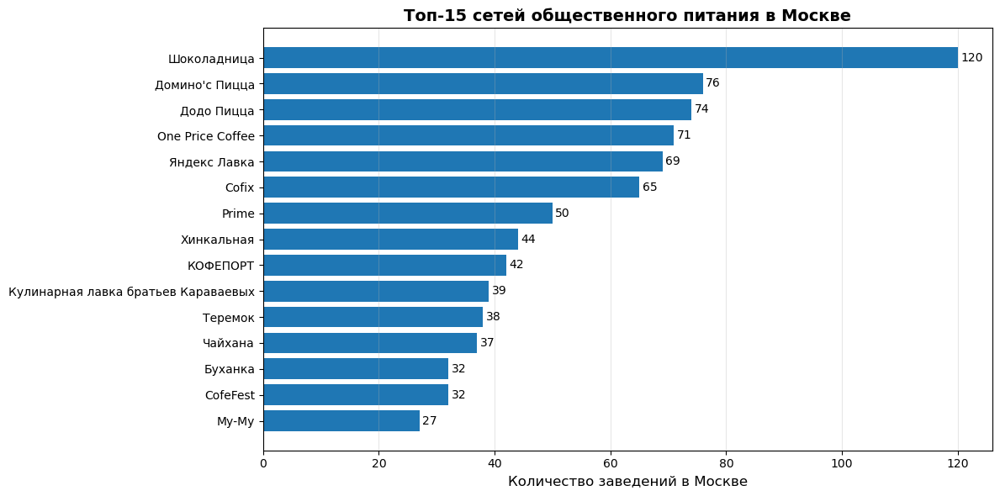


Вывод: Большинство топ-сетей - это кофейни, пиццерии и рестораны/кафе, что говорит о востребованности форматов 'кофе с собой' и быстрого перекуса.


In [17]:
# Сначала найдем все сетевые заведения
chain_places = df[df['chain'] == 1]

# Сгруппируем по названию сети
network_counts = chain_places['name'].value_counts().head(15)

print("Топ-15 сетей по количеству заведений:")
for i, (name, count) in enumerate(network_counts.items(), 1):
    # Найдем категорию этой сети
    category = chain_places[chain_places['name'] == name]['category'].iloc[0] if not chain_places[chain_places['name'] == name].empty else 'Неизвестно'
    print(f"   {i:2d}. {name:30s} - {count:3d} заведений ({category})")

# Визуализация
plt.figure(figsize=(12, 6))
bars = plt.barh(network_counts.index[::-1], network_counts.values[::-1])
plt.xlabel('Количество заведений в Москве', fontsize=12)
plt.title('Топ-15 сетей общественного питания в Москве', fontsize=14, fontweight='bold')

# Добавляем значения
for bar in bars:
    width = bar.get_width()
    plt.text(width + 0.5, bar.get_y() + bar.get_height()/2,
             f'{int(width)}', ha='left', va='center', fontsize=10)

plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()

print("\nВывод: Большинство топ-сетей - это кофейни, пиццерии и рестораны/кафе, что говорит о востребованности форматов 'кофе с собой' и быстрого перекуса.")

### Распределение заведений по административным районам

   Всего районов в данных: 9
   Топ-10 районов по количеству заведений:
    1. Центральный административный округ       - 2242 (26.7%)
    2. Северный административный округ          -  900 (10.7%)
    3. Южный административный округ             -  892 (10.6%)
    4. Северо-Восточный административный округ  -  891 (10.6%)
    5. Западный административный округ          -  851 (10.1%)
    6. Восточный административный округ         -  798 (9.5%)
    7. Юго-Восточный административный округ     -  714 (8.5%)
    8. Юго-Западный административный округ      -  709 (8.4%)
    9. Северо-Западный административный округ   -  409 (4.9%)


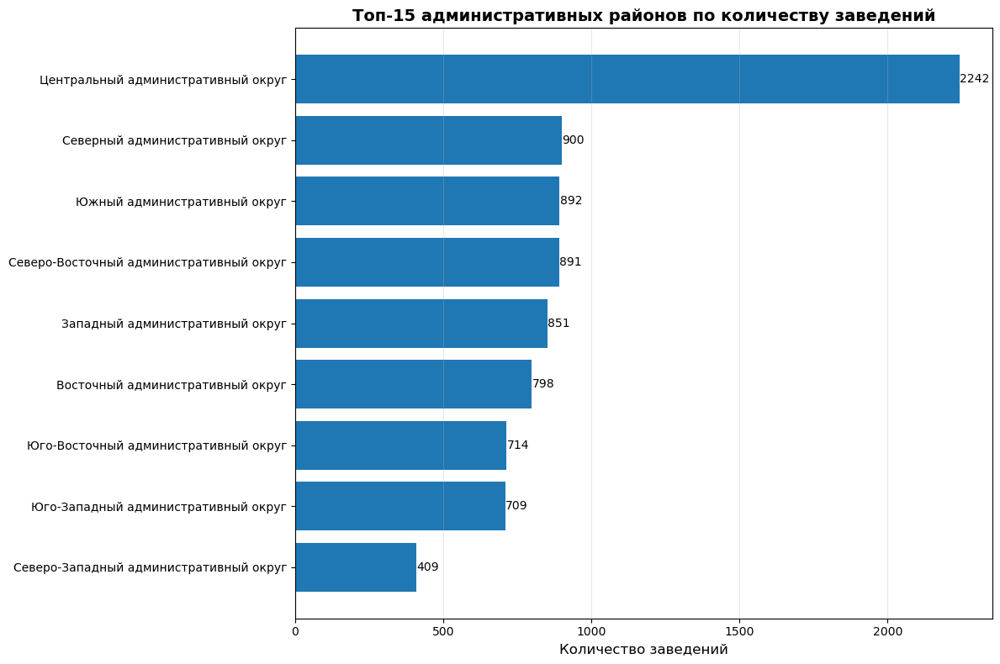


Категории заведений в топ-5 районах:


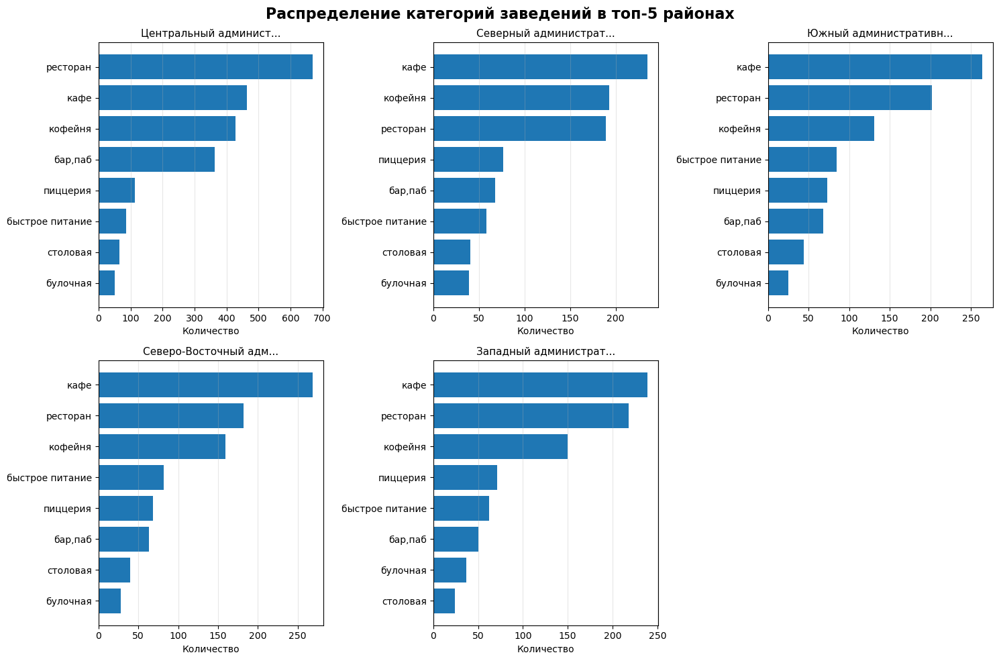

In [19]:
district_counts = df['district'].value_counts()
print(f"   Всего районов в данных: {len(district_counts)}")
print(f"   Топ-10 районов по количеству заведений:")

for i, (district, count) in enumerate(district_counts.head(10).items(), 1):
    percent = count / len(df) * 100
    print(f"   {i:2d}. {district:40s} - {count:4d} ({percent:.1f}%)")

# Топ-15 районов
plt.figure(figsize=(12, 8))
top_districts = district_counts.head(15)
bars = plt.barh(top_districts.index[::-1], top_districts.values[::-1])
plt.xlabel('Количество заведений', fontsize=12)
plt.title('Топ-15 административных районов по количеству заведений', fontsize=14, fontweight='bold')

# Добавляем значения
for bar in bars:
    width = bar.get_width()
    plt.text(width + 2, bar.get_y() + bar.get_height()/2,
             f'{int(width)}', ha='left', va='center', fontsize=10)

plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()

# Анализ категорий по районам (для топ-5 районов)
print("\nКатегории заведений в топ-5 районах:")
top_5_districts = district_counts.head(5).index.tolist()

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()

for idx, district in enumerate(top_5_districts):
    if idx < len(axes):
        district_data = df[df['district'] == district]
        category_dist = district_data['category'].value_counts().head(8)

        axes[idx].barh(category_dist.index[::-1], category_dist.values[::-1])
        axes[idx].set_title(f'{district[:20]}...' if len(district) > 20 else district, fontsize=11)
        axes[idx].set_xlabel('Количество')
        axes[idx].grid(axis='x', alpha=0.3)

# Убираем лишние оси
for i in range(len(top_5_districts), len(axes)):
    fig.delaxes(axes[i])

plt.suptitle('Распределение категорий заведений в топ-5 районах', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

### Распределение рейтингов по категориям

   Категории с наивысшим средним рейтингом:


,count,mean,median,std
category,,,,
"бар,паб",765,4.39,4.4,0.38
пиццерия,633,4.30,4.3,0.34
ресторан,2043,4.29,4.3,0.41


   Категории с наименьшим средним рейтингом:


,count,mean,median,std
category,,,,
быстрое питание,603,4.05,4.2,0.56
кафе,2378,4.12,4.2,0.57
столовая,315,4.21,4.3,0.45


/var/folders/3f/3ng7ys6906ngdc0rwxx8rxq00000gn/T/ipykernel_99082/1581318343.py:20: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  box = plt.boxplot([df_top_cats_rating[df_top_cats_rating['category'] == cat]['rating']


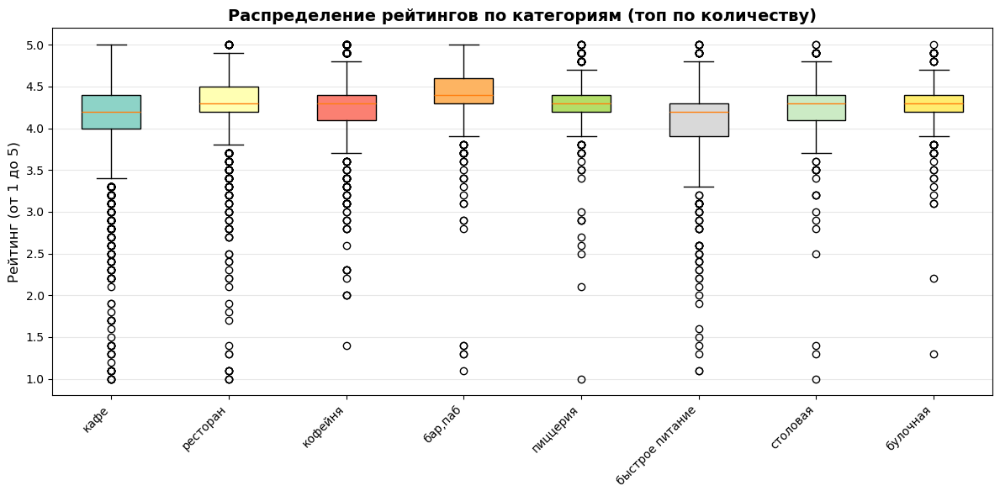


Вывод: Средние рейтинги по категориям довольно близки (4.0-4.5), что говорит о примерно одинаковом качестве обслуживания. Бары/пабы имеют наиболее более высокие оценки.


In [21]:
# Убираем пропуски в рейтингах
df_rating = df.dropna(subset=['rating'])

# Статистика рейтингов по категориям
rating_stats = df_rating.groupby('category')['rating'].agg(['count', 'mean', 'median', 'std']).round(2)

print("   Категории с наивысшим средним рейтингом:")
rating_stats = rating_stats.sort_values('mean', ascending=False)
display(rating_stats.head(3))

print("   Категории с наименьшим средним рейтингом:")
rating_stats = rating_stats.sort_values('mean', ascending=True)
display(rating_stats.head(3))

# Топ категорий по количеству заведений
top_cats_by_count = df_rating['category'].value_counts().head(10).index.tolist()
df_top_cats_rating = df_rating[df_rating['category'].isin(top_cats_by_count)]

plt.figure(figsize=(12, 6))
box = plt.boxplot([df_top_cats_rating[df_top_cats_rating['category'] == cat]['rating']
                   for cat in top_cats_by_count],
                  labels=top_cats_by_count,
                  patch_artist=True)

colors = plt.cm.Set3(np.linspace(0, 1, len(top_cats_by_count)))
for patch, color in zip(box['boxes'], colors):
    patch.set_facecolor(color)

plt.xticks(rotation=45, ha='right')
plt.ylabel('Рейтинг (от 1 до 5)', fontsize=12)
plt.title('Распределение рейтингов по категориям (топ по количеству)', fontsize=14, fontweight='bold')
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

print("\nВывод: Средние рейтинги по категориям довольно близки (4.0-4.5), что говорит о примерно одинаковом качестве обслуживания. Бары/пабы имеют наиболее более высокие оценки.")

### Хороплет со средним рейтингом по районам

In [23]:
# Вычисляем средний рейтинг по районам
district_rating = df_rating.groupby('district')['rating'].agg(['mean', 'count']).round(2)
district_rating = district_rating.sort_values('mean', ascending=False)

print("   Районы с наивысшим средним рейтингом:")
display(district_rating.head(10))

print("   Районы с наименьшим средним рейтингом:")
display(district_rating.tail(10))

# Загружаем геоданные для районов Москвы
with open('datasets/admin_level_geomap.geojson', 'r', encoding='utf-8') as f:
  moscow_geo = json.load(f)
  print("Геоданные загружены из файла")

    # Создаем простой словарь с координатами центра Москвы
  moscow_geo = {
        "type": "FeatureCollection",
        "features": []
    }

# Находим центр Москвы (средние координаты всех заведений)
center_lat = df['lat'].mean()
center_lon = df['lng'].mean()

# Создаем базовую карту
moscow_map = folium.Map(location=[center_lat, center_lon], zoom_start=11, tiles='CartoDB positron')

# Добавляем кластеры маркеров
marker_cluster = MarkerCluster().add_to(moscow_map)

# Добавляем заведения на карту
for idx, row in df.iterrows():
    if pd.notna(row['lat']) and pd.notna(row['lng']):
        # Цвет маркера в зависимости от категории
        color_map = {
            'кафе': 'blue',
            'ресторан': 'red',
            'кофейня': 'green',
            'бар': 'purple',
            'пиццерия': 'orange',
            'быстрое питание': 'darkred',
            'паб': 'black',
            'столовая': 'pink'
        }

        color = color_map.get(row['category'], 'gray')

        # Создаем popup с информацией
        popup_text = f"""
        <b>{row['name']}</b><br>
        Категория: {row['category']}<br>
        Рейтинг: {row['rating'] if pd.notna(row['rating']) else 'Н/Д'}<br>
        Средний чек: {row['middle_avg_bill'] if pd.notna(row['middle_avg_bill']) else 'Н/Д'} ₽<br>
        Адрес: {row['address']}
        """

        folium.Marker(
            location=[row['lat'], row['lng']],
            popup=folium.Popup(popup_text, max_width=300),
            icon=folium.Icon(color=color, icon='cutlery', prefix='fa')
        ).add_to(marker_cluster)
display(moscow_map)


   Районы с наивысшим средним рейтингом:


,mean,count
district,,
Центральный административный округ,4.38,2242
Северный административный округ,4.24,900
Северо-Западный административный округ,4.21,409
Западный административный округ,4.18,851
Южный административный округ,4.18,892
Восточный административный округ,4.17,798
Юго-Западный административный округ,4.17,709
Северо-Восточный административный округ,4.15,891
Юго-Восточный административный округ,4.10,714


   Районы с наименьшим средним рейтингом:


,mean,count
district,,
Центральный административный округ,4.38,2242
Северный административный округ,4.24,900
Северо-Западный административный округ,4.21,409
Западный административный округ,4.18,851
Южный административный округ,4.18,892
Восточный административный округ,4.17,798
Юго-Западный административный округ,4.17,709
Северо-Восточный административный округ,4.15,891
Юго-Восточный административный округ,4.10,714


Геоданные загружены из файла


### Топ-15 улиц по количеству заведений

   Топ-15 улиц по количеству заведений:
    1. проспект Мира                            - 184 заведений
    2. Профсоюзная                              - 123 заведений
    3. проспект Вернадского                     - 108 заведений
    4. Ленинский проспект                       - 107 заведений
    5. Ленинградский проспект                   -  95 заведений
    6. Дмитровское шоссе                        -  88 заведений
    7. Каширское шоссе                          -  77 заведений
    8. Варшавское шоссе                         -  76 заведений
    9. Ленинградское шоссе                      -  70 заведений
   10. МКАД                                     -  65 заведений
   11. Люблинская                               -  60 заведений
   12. Вавилова                                 -  55 заведений
   13. Кутузовский проспект                     -  54 заведений
   14. Миклухо-Маклая                           -  49 заведений
   15. Пятницкая                                -  48 заведений


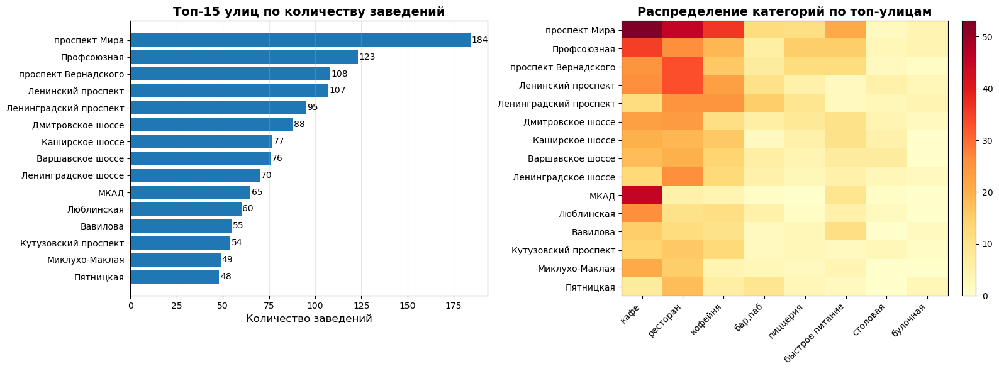

In [25]:
# Убираем строки без улиц
df_with_street = df.dropna(subset=['street'])

# Считаем количество заведений на улицах
street_counts = df_with_street['street'].value_counts().head(15)

print("   Топ-15 улиц по количеству заведений:")
for i, (street, count) in enumerate(street_counts.items(), 1):
    print(f"   {i:2d}. {street:40s} - {count:3d} заведений")

# Анализ категорий на топ-улицах
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

bars1 = ax1.barh(street_counts.index[::-1], street_counts.values[::-1])
ax1.set_xlabel('Количество заведений', fontsize=12)
ax1.set_title('Топ-15 улиц по количеству заведений', fontsize=14, fontweight='bold')

for bar in bars1:
    width = bar.get_width()
    ax1.text(width + 0.5, bar.get_y() + bar.get_height()/2,
             f'{int(width)}', ha='left', va='center', fontsize=10)

ax1.grid(axis='x', alpha=0.3)

# Распределение категорий по топ-улицам
top_streets = street_counts.index.tolist()
top_categories = df['category'].value_counts().head(8).index.tolist()

# Создаем матрицу
heatmap_data = pd.DataFrame(index=top_streets, columns=top_categories)

for street in top_streets:
    street_data = df_with_street[df_with_street['street'] == street]
    for category in top_categories:
        count = len(street_data[street_data['category'] == category])
        heatmap_data.loc[street, category] = count

heatmap_data = heatmap_data.astype(float)

# Визуализируем
im = ax2.imshow(heatmap_data, cmap='YlOrRd', aspect='auto')
ax2.set_xticks(range(len(top_categories)))
ax2.set_xticklabels(top_categories, rotation=45, ha='right', fontsize=10)
ax2.set_yticks(range(len(top_streets)))
ax2.set_yticklabels(top_streets, fontsize=10)
ax2.set_title('Распределение категорий по топ-улицам', fontsize=14, fontweight='bold')

# Добавляем цветовую шкалу
plt.colorbar(im, ax=ax2, fraction=0.046, pad=0.04)
ax2.grid(False)

plt.tight_layout()
plt.show()

### Улицы с одним заведением

In [27]:
# Находим улицы с ровно одним заведением
single_place_streets = df_with_street['street'].value_counts()
single_place_streets = single_place_streets[single_place_streets == 1]

print(f"   Улиц с одним заведением: {len(single_place_streets)}")
print(f"   Примеры улиц с одним заведением:")
for i, street in enumerate(single_place_streets.head(10).index.tolist(), 1):
    place = df_with_street[df_with_street['street'] == street].iloc[0]
    print(f"   {i:2d}. {street:40s} - {place['name']} ({place['category']})")

# Анализ категорий на этих улицах
single_place_categories = df_with_street[df_with_street['street'].isin(single_place_streets.index)]['category'].value_counts()

print(f"\n   Категории заведений на улицах с одним заведением:")
for i, (cat, count) in enumerate(single_place_categories.head(10).items(), 1):
    percent = count / len(single_place_streets) * 100
    print(f"   {i:2d}. {cat:20s} - {count:3d} ({percent:.1f}%)")

   Улиц с одним заведением: 460
   Примеры улиц с одним заведением:
    1. Зорге                                    - Кафе (кафе)
    2. 2-й Новоподмосковный переулок            - Мадина (ресторан)
    3. Чапаевский переулок                      - Сокол (кафе)
    4. Большой Волоколамский проезд             - Яндекс Лавка (ресторан)
    5. парк Зюзино                              - Пекарня (булочная)
    6. Симферопольский проезд                   - Кухня & Маркет (кафе)
    7. Замоскворецкая линия                     - ТЦ (ресторан)
    8. Водников                                 - Съестная лавка (столовая)
    9. Юго-Западный административный округ      - Семь хлебов (кафе)
   10. Генерала Глаголева                       - Хинкальная (ресторан)

   Категории заведений на улицах с одним заведением:
    1. кафе                 - 161 (35.0%)
    2. ресторан             -  92 (20.0%)
    3. кофейня              -  83 (18.0%)
    4. бар,паб              -  41 (8.9%)
    5. столовая       

### Анализ средних чеков по районам

   Районы с самыми высокими медианными чеками:


,median,mean,count
district,,,
Западный административный округ,1000.0,1053.0,306
Центральный административный округ,1000.0,1191.0,1060
Северо-Западный административный округ,700.0,822.0,157


   Районы с самыми низкими медианными чеками:


,median,mean,count
district,,,
Юго-Восточный административный округ,450.0,654.0,194
Северо-Восточный административный округ,500.0,717.0,301
Южный административный округ,500.0,834.0,314


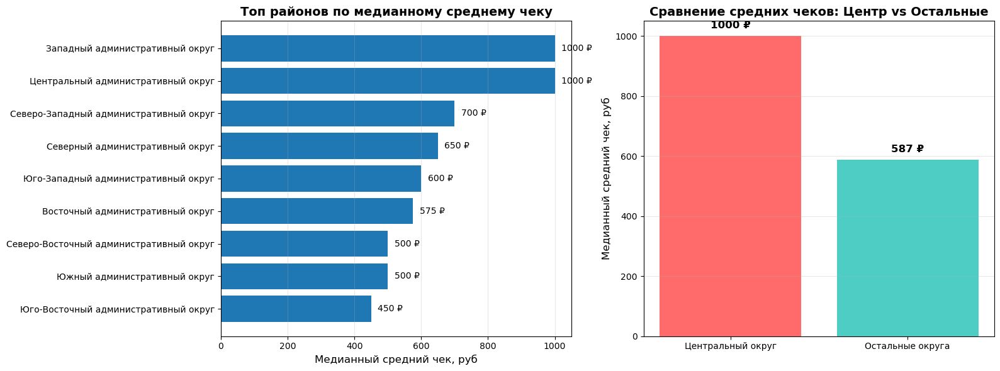


Вывод: В Западном и Центральном административном округе средний чек примерно на 70% выше, чем в других округах. Это связано с более высокой арендной платой и премиальным позиционированием заведений.


In [29]:
# Очищаем данные от пропусков в среднем чеке
df_bill = df.dropna(subset=['middle_avg_bill'])

# Вычисляем медианный средний чек по районам
district_bill = df_bill.groupby('district')['middle_avg_bill'].agg(['median', 'mean', 'count']).round(0)

print("   Районы с самыми высокими медианными чеками:")
district_bill = district_bill.sort_values('median', ascending=False)
display(district_bill.head(3))

print("   Районы с самыми низкими медианными чеками:")
district_bill = district_bill.sort_values('median', ascending=True)
display(district_bill.head(3))

# Визуализация
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Топ районов по медианному чеку
district_bill = district_bill.sort_values('median', ascending=False)
top_districts_bill = district_bill.head(10)

bars = ax1.barh(top_districts_bill.index[::-1], top_districts_bill['median'][::-1])
ax1.set_xlabel('Медианный средний чек, руб', fontsize=12)
ax1.set_title('Топ районов по медианному среднему чеку', fontsize=14, fontweight='bold')

for bar in bars:
    width = bar.get_width()
    ax1.text(width + 20, bar.get_y() + bar.get_height()/2,
             f'{int(width)} ₽', ha='left', va='center', fontsize=10)

ax1.grid(axis='x', alpha=0.3)

# Сравнение Центрального округа с другими
central_districts = ['Центральный административный округ', 'ЦАО']
other_districts = [d for d in district_bill.index if d not in central_districts]

if 'Центральный административный округ' in district_bill.index:
    central_median = district_bill.loc['Центральный административный округ', 'median']
    other_median = district_bill.loc[other_districts, 'median'].median()

    ax2.bar(['Центральный округ', 'Остальные округа'],
            [central_median, other_median],
            color=['#ff6b6b', '#4ecdc4'])
    ax2.set_ylabel('Медианный средний чек, руб', fontsize=12)
    ax2.set_title('Сравнение средних чеков: Центр vs Остальные', fontsize=14, fontweight='bold')

    # Добавляем значения на столбцы
    for i, v in enumerate([central_median, other_median]):
        ax2.text(i, v + 20, f'{int(v)} ₽', ha='center', va='bottom', fontsize=12, fontweight='bold')

    ax2.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

print(f"\nВывод: В Западном и Центральном административном округе средний чек примерно на {(central_median/other_median - 1)*100:.0f}% выше, чем в других округах. Это связано с более высокой арендной платой и премиальным позиционированием заведений.")

## Исследование открытия кофейни

### Распределение кофеен по районам

Всего кофеен в датасете: 1413
   Кофейни представлены в 9 районах
   Топ-10 районов по количеству кофеен:
    1. Центральный административный округ       - 428 (30.3%)
    2. Северный административный округ          - 193 (13.7%)
    3. Северо-Восточный административный округ  - 159 (11.3%)
    4. Западный административный округ          - 150 (10.6%)
    5. Южный административный округ             - 131 (9.3%)
    6. Восточный административный округ         - 105 (7.4%)
    7. Юго-Западный административный округ      -  96 (6.8%)
    8. Юго-Восточный административный округ     -  89 (6.3%)
    9. Северо-Западный административный округ   -  62 (4.4%)


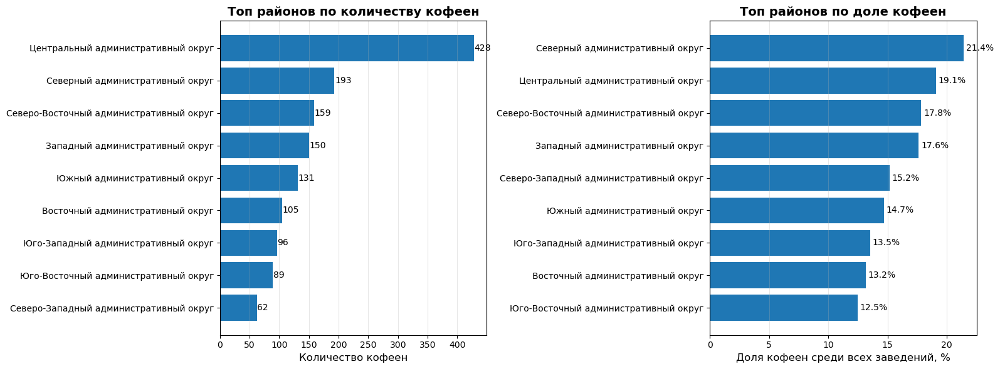

In [32]:
# Выбираем только кофейни
coffee_shops = df[df['category'] == 'кофейня'].copy()
print(f"Всего кофеен в датасете: {len(coffee_shops)}")

coffee_by_district = coffee_shops['district'].value_counts()
print(f"   Кофейни представлены в {len(coffee_by_district)} районах")
print(f"   Топ-10 районов по количеству кофеен:")

for i, (district, count) in enumerate(coffee_by_district.head(10).items(), 1):
    percent = count / len(coffee_shops) * 100
    print(f"   {i:2d}. {district:40s} - {count:3d} ({percent:.1f}%)")

# Визуализация
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Топ-15 районов по количеству кофеен
top_coffee_districts = coffee_by_district.head(15)

bars1 = ax1.barh(top_coffee_districts.index[::-1], top_coffee_districts.values[::-1])
ax1.set_xlabel('Количество кофеен', fontsize=12)
ax1.set_title('Топ районов по количеству кофеен', fontsize=14, fontweight='bold')

for bar in bars1:
    width = bar.get_width()
    ax1.text(width + 0.5, bar.get_y() + bar.get_height()/2,
             f'{int(width)}', ha='left', va='center', fontsize=10)

ax1.grid(axis='x', alpha=0.3)

# Плотность кофеен (доля кофеен от всех заведений в районе)
district_total = df['district'].value_counts()
coffee_density = (coffee_by_district / district_total * 100).fillna(0).sort_values(ascending=False).head(15)

bars2 = ax2.barh(coffee_density.index[::-1], coffee_density.values[::-1])
ax2.set_xlabel('Доля кофеен среди всех заведений, %', fontsize=12)
ax2.set_title('Топ районов по доле кофеен', fontsize=14, fontweight='bold')

for bar in bars2:
    width = bar.get_width()
    ax2.text(width + 0.2, bar.get_y() + bar.get_height()/2,
             f'{width:.1f}%', ha='left', va='center', fontsize=10)

ax2.grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.show()

### Круглосуточные кофейни

In [34]:
coffee_24_7 = coffee_shops[coffee_shops['is_24_7'] == True]
print(f"   Круглосуточных кофеен: {len(coffee_24_7)} ({len(coffee_24_7)/len(coffee_shops)*100:.1f}% от всех кофеен)")

if len(coffee_24_7) > 0:
    print(f"   Примеры круглосуточных кофеен:")
    for i, (idx, row) in enumerate(coffee_24_7.head(5).iterrows(), 1):
        print(f"   {i}. {row['name']} - {row['district']} (рейтинг: {row['rating'] if pd.notna(row['rating']) else 'Н/Д'})")

   Круглосуточных кофеен: 76 (5.4% от всех кофеен)
   Примеры круглосуточных кофеен:
   1. Wild Bean - Северный административный округ (рейтинг: 3.5)
   2. Wild Bean Cafe - Северо-Восточный административный округ (рейтинг: 4.0)
   3. Wild Bean Cafe - Северо-Восточный административный округ (рейтинг: 4.5)
   4. Wild Bean Cafe - Северо-Западный административный округ (рейтинг: 4.3)
   5. Шоколадница - Северо-Западный административный округ (рейтинг: 4.2)


### Рейтинги кофеен

   Средний рейтинг кофеен: 4.28
   Медианный рейтинг: 4.30
   Стандартное отклонение: 0.37
   Минимальный рейтинг: 1.40
   Максимальный рейтинг: 5.00

   Средние рейтинги в топ районах по количеству кофеен:
    1. Центральный административный о - 4.34 (428 кофеен)
    2. Северный административный окру - 4.29 (193 кофеен)
    3. Южный административный округ   - 4.23 (131 кофеен)
    4. Северо-Восточный административ - 4.22 (159 кофеен)
    5. Западный административный окру - 4.20 (150 кофеен)


/var/folders/3f/3ng7ys6906ngdc0rwxx8rxq00000gn/T/ipykernel_99082/766020051.py:43: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  box = ax2.boxplot(coffee_data_for_box, labels=[d[:15] + '...' if len(d) > 15 else d for d in top_5_for_box],


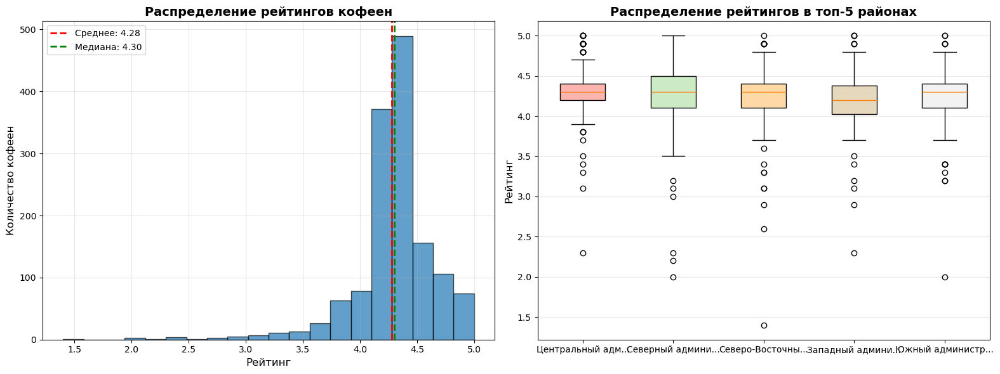

In [36]:
coffee_ratings = coffee_shops.dropna(subset=['rating'])['rating']

print(f"   Средний рейтинг кофеен: {coffee_ratings.mean():.2f}")
print(f"   Медианный рейтинг: {coffee_ratings.median():.2f}")
print(f"   Стандартное отклонение: {coffee_ratings.std():.2f}")
print(f"   Минимальный рейтинг: {coffee_ratings.min():.2f}")
print(f"   Максимальный рейтинг: {coffee_ratings.max():.2f}")

# Рейтинги по районам (для топ районов по количеству кофеен)
print("\n   Средние рейтинги в топ районах по количеству кофеен:")
top_10_coffee_districts = coffee_by_district.head(5).index.tolist()

rating_by_district = {}
for district in top_10_coffee_districts:
    district_ratings = coffee_shops[coffee_shops['district'] == district]['rating'].dropna()
    if len(district_ratings) > 0:
        rating_by_district[district] = district_ratings.mean()

# Сортируем по рейтингу
sorted_ratings = sorted(rating_by_district.items(), key=lambda x: x[1], reverse=True)

for i, (district, rating) in enumerate(sorted_ratings, 1):
    count = coffee_by_district[district]
    print(f"   {i:2d}. {district[:30]:30s} - {rating:.2f} ({count} кофеен)")

# Визуализация распределения рейтингов
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Гистограмма рейтингов всех кофеен
ax1.hist(coffee_ratings, bins=20, edgecolor='black', alpha=0.7)
ax1.axvline(coffee_ratings.mean(), color='red', linestyle='--', linewidth=2, label=f'Среднее: {coffee_ratings.mean():.2f}')
ax1.axvline(coffee_ratings.median(), color='green', linestyle='--', linewidth=2, label=f'Медиана: {coffee_ratings.median():.2f}')
ax1.set_xlabel('Рейтинг', fontsize=12)
ax1.set_ylabel('Количество кофеен', fontsize=12)
ax1.set_title('Распределение рейтингов кофеен', fontsize=14, fontweight='bold')
ax1.legend()
ax1.grid(alpha=0.3)

# Boxplot рейтингов по топ-5 районам
top_5_for_box = top_10_coffee_districts[:5]
coffee_data_for_box = [coffee_shops[coffee_shops['district'] == d]['rating'].dropna() for d in top_5_for_box]

box = ax2.boxplot(coffee_data_for_box, labels=[d[:15] + '...' if len(d) > 15 else d for d in top_5_for_box],
                  patch_artist=True)
colors = plt.cm.Pastel1(np.linspace(0, 1, len(top_5_for_box)))
for patch, color in zip(box['boxes'], colors):
    patch.set_facecolor(color)

ax2.set_ylabel('Рейтинг', fontsize=12)
ax2.set_title('Распределение рейтингов в топ-5 районах', fontsize=14, fontweight='bold')
ax2.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

### Анализ стоимости чашки капучино

   Кофеен с указанной ценой капучино: 521 (36.9% от всех кофеен)

   Статистика по цене чашки капучино:
   Средняя цена: 175 ₽
   Медианная цена: 170 ₽
   Минимальная цена: 60 ₽
   Максимальная цена: 1568 ₽
   Стандартное отклонение: 90 ₽

   Медианные цены в топ-5 районах по количеству кофеен:
   Центральный административный о - 190 ₽ (162 кофеен)
   Северный административный окру - 159 ₽ (76 кофеен)
   Северо-Восточный административ - 162 ₽ (60 кофеен)
   Западный административный окру - 189 ₽ (49 кофеен)
   Южный административный округ   - 150 ₽ (43 кофеен)


/var/folders/3f/3ng7ys6906ngdc0rwxx8rxq00000gn/T/ipykernel_99082/1864289165.py:45: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  box = ax2.boxplot(price_data_for_box, labels=labels, patch_artist=True)


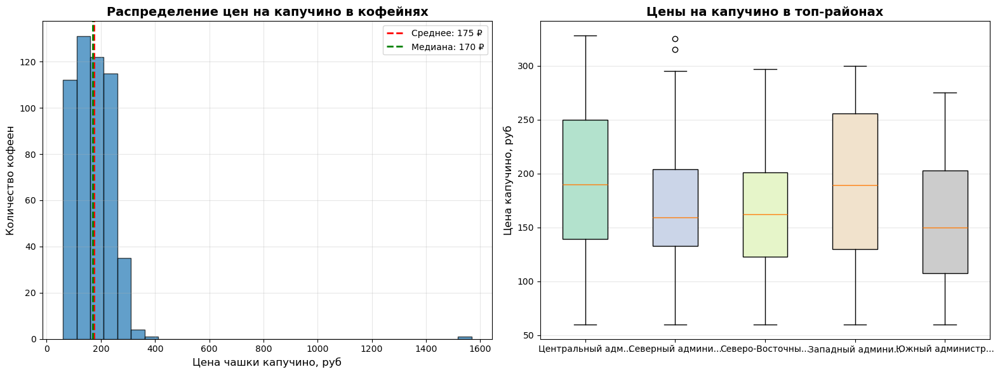

In [38]:
# Берем только кофейни с указанной ценой капучино
coffee_with_cup = coffee_shops.dropna(subset=['middle_coffee_cup'])
print(f"   Кофеен с указанной ценой капучино: {len(coffee_with_cup)} ({len(coffee_with_cup)/len(coffee_shops)*100:.1f}% от всех кофеен)")

if len(coffee_with_cup) > 0:
    cup_price = coffee_with_cup['middle_coffee_cup']

    print(f"\n   Статистика по цене чашки капучино:")
    print(f"   Средняя цена: {cup_price.mean():.0f} ₽")
    print(f"   Медианная цена: {cup_price.median():.0f} ₽")
    print(f"   Минимальная цена: {cup_price.min():.0f} ₽")
    print(f"   Максимальная цена: {cup_price.max():.0f} ₽")
    print(f"   Стандартное отклонение: {cup_price.std():.0f} ₽")

    # Цены по районам (для топ-5 районов)
    print(f"\n   Медианные цены в топ-5 районах по количеству кофеен:")
    for district in top_5_for_box:
        district_prices = coffee_with_cup[coffee_with_cup['district'] == district]['middle_coffee_cup']
        if len(district_prices) > 0:
            print(f"   {district[:30]:30s} - {district_prices.median():.0f} ₽ ({len(district_prices)} кофеен)")

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

    # Гистограмма цен
    ax1.hist(cup_price, bins=30, edgecolor='black', alpha=0.7)
    ax1.axvline(cup_price.mean(), color='red', linestyle='--', linewidth=2, label=f'Среднее: {cup_price.mean():.0f} ₽')
    ax1.axvline(cup_price.median(), color='green', linestyle='--', linewidth=2, label=f'Медиана: {cup_price.median():.0f} ₽')
    ax1.set_xlabel('Цена чашки капучино, руб', fontsize=12)
    ax1.set_ylabel('Количество кофеен', fontsize=12)
    ax1.set_title('Распределение цен на капучино в кофейнях', fontsize=14, fontweight='bold')
    ax1.legend()
    ax1.grid(alpha=0.3)

    # Цены по районам
    price_data_for_box = []
    labels = []

    for district in top_5_for_box:
        district_prices = coffee_with_cup[coffee_with_cup['district'] == district]['middle_coffee_cup']
        if len(district_prices) > 0:
            price_data_for_box.append(district_prices)
            labels.append(district[:15] + '...' if len(district) > 15 else district)

    if price_data_for_box:
        box = ax2.boxplot(price_data_for_box, labels=labels, patch_artist=True)
        colors = plt.cm.Pastel2(np.linspace(0, 1, len(price_data_for_box)))
        for patch, color in zip(box['boxes'], colors):
            patch.set_facecolor(color)

        ax2.set_ylabel('Цена капучино, руб', fontsize=12)
        ax2.set_title('Цены на капучино в топ-районах', fontsize=14, fontweight='bold')
        ax2.grid(axis='y', alpha=0.3)

    plt.tight_layout()
    plt.show()

## Ключевые выводы и рекомендации

In [40]:
print("\n1. Картина рынка:")
print("   • Всего заведений в датасете: {:,}".format(len(df)))
print("   • Кафе и рестораны составляют более 50% рынка")
print("   • 62% заведений - несетевые, что говорит о возможности для роста сетей")

print("\n2. Рынок кофеен:")
print("   • Всего кофеен: {} ({:.1f}% от всех заведений)".format(len(coffee_shops), len(coffee_shops)/len(df)*100))
print("   • Топ-3 района по количеству кофеен: {}, {}, {}".format(
    coffee_by_district.index[0],
    coffee_by_district.index[1] if len(coffee_by_district) > 1 else "Н/Д",
    coffee_by_district.index[2] if len(coffee_by_district) > 2 else "Н/Д"
))
print("   • Средний рейтинг кофеен: {:.2f} (выше среднего по рынку)".format(coffee_ratings.mean()))
print("   • Круглосуточных кофеен всего: {} ({:.1f}%)".format(len(coffee_24_7), len(coffee_24_7)/len(coffee_shops)*100))

print("\n3. Ценовая политика:")
print("   • Медианная цена капучино: {:.0f} ₽".format(coffee_with_cup['middle_coffee_cup'].median() if len(coffee_with_cup) > 0 else "Н/Д"))
print("   • В Центральном округе средний чек на {:.0f}% выше, чем в других".format((central_median/other_median - 1)*100 if 'central_median' in locals() else "Н/Д"))

print("\n4. Рекомендации для открытия кофейни:")
print("\n   Локация")
print("   • Рекомендуем рассмотреть районы с высокой проходимостью, но не перенасыщенные кофейнями")
print("   • Избегать районов с самой высокой конкуренцией")
print("   • Рассмотреть районы с низкой долей кофеен от общего числа заведений")

print("\n   Ценовая стратегия")
print("   • Установить цену капучино в диапазоне {}-{} руб".format(
    int(coffee_with_cup['middle_coffee_cup'].quantile(0.25)) if len(coffee_with_cup) > 0 else 150,
    int(coffee_with_cup['middle_coffee_cup'].quantile(0.75)) if len(coffee_with_cup) > 0 else 250
))
print("   • Для премиального позиционирования - верхняя граница диапазона")
print("   • Для массового рынка - нижняя граница диапазона")

print("\n   Режим работы")
print("   • Круглосуточный формат может быть конкурентным преимуществом (только {:.1f}% кофеен работают 24/7)".format(
    len(coffee_24_7)/len(coffee_shops)*100
))
print("   • Для района с ночной жизнью - обязательно круглосуточно")
print("   • Для делового района - раннее открытие")


1. Картина рынка:
   • Всего заведений в датасете: 8,406
   • Кафе и рестораны составляют более 50% рынка
   • 62% заведений - несетевые, что говорит о возможности для роста сетей

2. Рынок кофеен:
   • Всего кофеен: 1413 (16.8% от всех заведений)
   • Топ-3 района по количеству кофеен: Центральный административный округ, Северный административный округ, Северо-Восточный административный округ
   • Средний рейтинг кофеен: 4.28 (выше среднего по рынку)
   • Круглосуточных кофеен всего: 76 (5.4%)

3. Ценовая политика:
   • Медианная цена капучино: 170 ₽
   • В Центральном округе средний чек на 70% выше, чем в других

4. Рекомендации для открытия кофейни:

   Локация
   • Рекомендуем рассмотреть районы с высокой проходимостью, но не перенасыщенные кофейнями
   • Избегать районов с самой высокой конкуренцией
   • Рассмотреть районы с низкой долей кофеен от общего числа заведений

   Ценовая стратегия
   • Установить цену капучино в диапазоне 124-225 руб
   • Для премиального позиционирова

Презентация: https://disk.yandex.ru/i/GSO7PyE7C5uQSw